## Import and download ocr engine

In [1]:
# !git clone https://github.com/wichtounet/sudoku_dataset.git
# !pip install py-sudoku
# !pip install paddlepaddle
# !pip install paddleocr
# !pip install imutils
# !pip install opencv-python
# !conda install -c conda-forge glib -y

In [2]:
# !conda install -c mcs07 tesseract -y
# !conda install -c jim-hart pytesseract -y

In [1]:
import cv2
import imutils
from imutils.perspective import four_point_transform
from skimage.segmentation import clear_border

import numpy as np
import re
from sudoku import Sudoku

from paddleocr import PaddleOCR
import pytesseract

from IPython.display import display
from PIL import Image

In [2]:
# Initialize OCR engine
ocr = PaddleOCR(use_angle_cls=True, lang="ch", use_mp=True)

[2025/02/08 02:20:15] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/home/studio-lab-user/.paddleocr/whl/det/ch/ch_PP-OCRv4_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/home/studio-lab-user/.paddleocr/whl/rec/ch/ch_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_

## Find sudoku puzzle

In [59]:
def find_puzzle_contour(image, debug=False):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply multiple preprocessing techniques to handle different image conditions
    preprocessed_images = []

    # 1. Standard preprocessing
    blurred = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh1 = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    preprocessed_images.append(cv2.bitwise_not(thresh1))

    # 2. Additional preprocessing with different parameters
    blurred2 = cv2.GaussianBlur(gray, (7, 7), 0)
    thresh2 = cv2.adaptiveThreshold(blurred2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 15, 5)
    preprocessed_images.append(cv2.bitwise_not(thresh2))

    # 3. Add contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    blurred3 = cv2.GaussianBlur(enhanced, (9, 9), 0)
    thresh3 = cv2.adaptiveThreshold(blurred3, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    preprocessed_images.append(cv2.bitwise_not(thresh3))
    
    # 4. Canny Edge Detection
    edges = cv2.Canny(gray, 50, 150)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    thick_edges = cv2.dilate(edges, kernel, iterations=1)
    preprocessed_images.append(thick_edges)


    # Try to find the puzzle in each preprocessed image
    for idx, thresh in enumerate(preprocessed_images):
        # Find contours
        cnts = cv2.findContours(thresh.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE) 
        cnts = imutils.grab_contours(cnts)
        cnts = sorted(cnts, key=cv2.contourArea, reverse=True)[:20]
        # cnts = sorted(cnts, key=lambda c: cv2.arcLength(c, True), reverse=True)[:10]
        if debug:
            output = image.copy()
            cv2.drawContours(output, cnts, -1, (0, 255, 0), 2)
            display(Image.fromarray(output))

        # Initialize puzzle contour
        puzzleCnt = None

        # Loop over the contours
        for c in cnts:
            # Calculate contour area and perimeter
            area = cv2.contourArea(c)
            peri = cv2.arcLength(c, True)

            # Filter out very small contours relative to image size
            image_area = image.shape[0] * image.shape[1]
            if area < image_area * 0.008:
                continue
                
            # Check if the contour is approximately square
            x,y,w,h = cv2.boundingRect(c)
            aspect_ratio = w / float(h)
            if not (0.2 <= aspect_ratio <= 1.9):
                continue
                
            # Approximate the contour
            approx = cv2.approxPolyDP(c, 0.02 * peri, True)

            # Convex Hull Check
            hull = cv2.convexHull(c)
            if not cv2.isContourConvex(hull):
                continue

            # Check if we have found our puzzle
            if len(approx) == 4:   
                # Calculate the lengths of the sides of the quadrilateral
                pts = approx.reshape(4, 2)
                edges = [
                    np.linalg.norm(pts[i] - pts[(i + 1) % 4]) for i in range(4)
                ]
                # print(edges)
                short_edge = min(edges)
                long_edge = max(edges)
                
                # Calculate the ratio of the short edge to the long edge
                edge_ratio = short_edge / long_edge
                
                # Ensure the contour is approximately square-like
                if edge_ratio < 0.58:  # Adjust this threshold as needed
                    continue
                
                puzzleCnt = approx
                output = image.copy()
                break  
                
        if puzzleCnt is not None:
            if debug:
                output = image.copy()
                cv2.drawContours(output, [puzzleCnt], -1, (0, 255, 0), 2)
                display(Image.fromarray(output))
            return puzzleCnt


    raise Exception(("Could not find Sudoku puzzle outline. "
        "Try debugging your thresholding and contour steps."))
    

def find_puzzle(image, debug=False):
    puzzle_contour = find_puzzle_contour(image, debug)

    # Transform the puzzle
    puzzle = four_point_transform(image, puzzle_contour.reshape(4, 2))
    puzzle = cv2.cvtColor(puzzle, cv2.COLOR_BGR2GRAY)
    puzzle = cv2.resize(puzzle, (3150, 3150))
    warped = four_point_transform(image, puzzle_contour.reshape(4, 2))
    if debug:
       # Show the output warped image
       display(Image.fromarray(cv2.resize(puzzle, (512, 512))))
    return (puzzle, warped)

## Detect angle orientation of sudoku board

In [110]:
def get_right_perspective(sudoku_board_gray, sudoku_board_rgb, debug=False):
    board = cv2.resize(sudoku_board_gray, (512, 512))
    row1 = np.hstack([board, board, board, board, board])
    row2 = np.hstack([board, board, board, board, board])
    row3 = np.hstack([board, board, board, board, board])
    row4 = np.hstack([board, board, board, board, board])
    row5 = np.hstack([board, board, board, board, board])
    combined_board = np.vstack([row1, row2, row3, row4, row5])

    # Default angle to 180 in case of error
    angle = 0
    try:
        osd_data = pytesseract.image_to_osd(Image.fromarray(combined_board))
        angle = int(re.search(r"Orientation in degrees: (\d+)", osd_data).group(1))
    except Exception as e:
        print(f"OSD detection failed: {e}. Defaulting to angle 0.")

    board_rotated_gray = sudoku_board_gray.copy()
    board_rotated_rgb = sudoku_board_rgb.copy()
    # Rotate image
    if angle != 0:
        if angle == 90:
            board_rotated_gray = cv2.rotate(sudoku_board_gray, cv2.ROTATE_90_COUNTERCLOCKWISE)
            board_rotated_rgb = cv2.rotate(sudoku_board_rgb, cv2.ROTATE_90_COUNTERCLOCKWISE)
        elif angle == 180:
            board_rotated_gray = cv2.rotate(sudoku_board_gray, cv2.ROTATE_180)
            board_rotated_rgb = cv2.rotate(sudoku_board_rgb, cv2.ROTATE_180)
        elif angle == 270:
            board_rotated_gray = cv2.rotate(sudoku_board_gray, cv2.ROTATE_90_CLOCKWISE)
            board_rotated_rgb = cv2.rotate(sudoku_board_grgb, cv2.ROTATE_90_CLOCKWISE)
        
    return (board_rotated_gray, board_rotated_rgb)

## Preprocess board for better OCR result

In [5]:
def preprocess_board(image):
    """
    Pre-process the entire Sudoku board image to enhance digit recognition.

    Args:
        image: Grayscale input image of the Sudoku board
    Returns:
        Preprocessed image with enhanced digit visibility
    """
    # Reduce noise with Gaussian blur
    blurred = cv2.GaussianBlur(image, (9, 9), 0)

    # Enhance contrast to make digits more prominent
    contrast = cv2.convertScaleAbs(blurred, alpha=0.9, beta=0)

    # Apply sharpening kernel to improve digit edges
    sharpen_kernel = np.array([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ])
    sharpened = cv2.filter2D(contrast, -1, sharpen_kernel)

    return sharpened

def preprocess_cell(cell):
    """
    Process individual Sudoku cell to isolate and clean the digit.

    Args:
        cell: Single cell image from the Sudoku grid
    Returns:
        Processed cell image with isolated digit
    """
    # Apply Otsu's thresholding to get binary image
    thresh = cv2.threshold(cell, 0, 255,
                         cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

    # Remove border artifacts
    thresh = clear_border(thresh)

    # Smooth the digit shape
    thresh = cv2.GaussianBlur(thresh, (3, 3), 0)

    # Enhance digit thickness
    thresh = cv2.dilate(thresh, None, iterations=1)

    # Find digit contours
    cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL,
                           cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)

    # Return original cell if no contours found
    if len(cnts) == 0:
        return cell

    # Get largest contour (should be the digit)
    c = max(cnts, key=cv2.contourArea)

    # Create mask for the digit
    mask = np.zeros(thresh.shape, dtype="uint8")
    cv2.drawContours(mask, [c], -1, 255, -1)

    # Calculate percentage of cell filled by contour
    (h, w) = thresh.shape
    percentFilled = cv2.countNonZero(mask) / float(w * h)

    # Filter out noise (contours that are too small)
    if percentFilled < 0.04:
        return cell

    # Apply mask to get clean digit
    digit = cv2.bitwise_and(thresh, thresh, mask=mask)
    digit = cv2.bitwise_not(digit)

    return digit

def process_sudoku_grid(puzzle, debug=False):
    """
    Split Sudoku image into 81 cells and process each cell individually.

    Args:
        puzzle: Input Sudoku board image
        debug: Boolean to enable visualization of processed grid
    Returns:
        Processed Sudoku board with enhanced digits
    """
    height, width = puzzle.shape[:2]
    cell_height, cell_width = height // 9, width // 9

    # Create empty array for processed puzzle
    processed_puzzle = np.zeros((height, width), dtype=np.uint8)

    # Process each cell
    for y in range(9):
        for x in range(9):
            # Calculate cell boundaries
            y0, y1 = y * cell_height, (y + 1) * cell_height
            x0, x1 = x * cell_width, (x + 1) * cell_width

            # Extract and process individual cell
            cell = puzzle[y0:y1, x0:x1]
            processed_cell = preprocess_cell(cell)

            # Place processed cell back into grid
            processed_puzzle[y0:y1, x0:x1] = processed_cell

    # Show debug visualization if enabled
    if debug:
        display(Image.fromarray(processed_puzzle))

    return processed_puzzle

## OCR sudoku board and return final puzzle

In [6]:
def extract_angle_orientation(board, result_ocr, padding=5, debug=False):
    """
    Extracts the angle orientation for each detected text in the OCR result.
    Returns a list of dictionaries containing text and its classification result.
    """
    cls_results = []

    for line in result_ocr:
        for detection in line:
            bbox, (text, score) = detection[0], detection[1]

            # Compute padded bounding box
            x_min, y_min = max(0, int(bbox[0][0]) - padding), max(0, int(bbox[0][1]) - padding)
            x_max, y_max = min(board.shape[1], int(bbox[2][0]) + padding), min(board.shape[0], int(bbox[2][1]) + padding)

            # Crop region of interest (ROI)
            roi = board[y_min:y_max, x_min:x_max]

            # Extract classification result for the specific ROI
            cls_result = ocr.ocr(roi, cls=True, det=False, rec=False)

            cls_angle = cls_result[0][0][0] if cls_result else None
            cls_score = cls_result[0][0][1] if cls_result else None
            cls_results.append((text, cls_angle, cls_score))

    if debug:
        print(cls_results)

    return cls_results


def extract_sudoku_digit(sudoku_board, result_ocr):
    height, width = sudoku_board.shape[:2]
    cell_width = width // 9
    cell_height = height // 9
    min_box_area = (cell_width * cell_height) * 0.1  # Set a threshold at 10% of a cell's area
    min_box_height = cell_height * 0.35  # Skip boxes shorter than 20% of a cell's height
    
    # Khởi tạo ma trận Sudoku 9x9
    digits = [[0 for _ in range(9)] for _ in range(9)]
    cell_counts = [[0 for _ in range(9)] for _ in range(9)]  # Track bounding box count per cell
    
    for line in result_ocr:
        for bbox, info in line:
            text, score = info

            # Calculate bounding box area, width, and height
            x_min, y_min = bbox[0]
            x_max, y_max = bbox[2]
            box_area = (x_max - x_min) * (y_max - y_min)
            box_height = y_max - y_min

            # Compute the bounding box center
            x_center = int((x_min + x_max) / 2)
            y_center = int((y_min + y_max) / 2)

            # Tìm vị trí hàng, cột tương ứng trên Sudoku board
            row = min(y_center // cell_height, 8)  # Giới hạn tối đa index là 8
            col = min(x_center // cell_width, 8)

            # Increment the cell's bounding box count
            cell_counts[row][col] += 1

            # Skip cells with multiple bounding boxes
            if cell_counts[row][col] > 1:
                digits[row][col] = 0  # Reset to 0 if multiple boxes detected
                continue

            # Ignore bounding boxes that are too small, too narrow, or too short
            if box_area < min_box_area or box_height < min_box_height:
                continue  # Skip this box

            # Dùng regex để chỉ lấy số hợp lệ
            number = re.search(r'\d', text)  # Tìm số đầu tiên xuất hiện
            digit = int(number.group()) if number else 0  # Nếu có số, lấy số đó; nếu không, trả về 0

            digits[row][col] = digit  # Gán số vào mảng

    return digits

In [7]:
def ocr_sudoku(sudoku_board, debug=False):
    height, width = sudoku_board.shape[:2]
    cell_width = width // 9
    cell_height = height // 9
    slices = {'horizontal_stride': cell_width, 'vertical_stride': cell_height, 'merge_x_thres': 0.05, 'merge_y_thres': 0.05}
    result_ocr = ocr.ocr(sudoku_board, cls=False, slice=slices)
    result_det = [detection[0] for line in result_ocr for detection in line]
    result_rec = [(sublist[1][0], sublist[1][1]) for group in result_ocr for sublist in group]
    result_cls = extract_angle_orientation(sudoku_board, result_ocr, debug=False)
    digits = extract_sudoku_digit(sudoku_board, result_ocr)
    
    filtered_cls = [item for item in result_cls if item[2] > 0.68]
    num_zero_angle = sum(1 for item in filtered_cls if '0' in item)
    
    if (len(filtered_cls) == 0) or ((num_zero_angle / len(filtered_cls) < 0.7) or (len(result_det) < 17)):
        sudoku_board = cv2.rotate(sudoku_board, cv2.ROTATE_180)
        result_ocr = ocr.ocr(sudoku_board, cls=False, slice=slices)
        result_det = [detection[0] for line in result_ocr for detection in line]
        result_rec = [(sublist[1][0], sublist[1][1]) for group in result_ocr for sublist in group]
        digits = extract_sudoku_digit(sudoku_board, result_ocr)
            

    # Tạo bảng sudoku
    puzzle = Sudoku(3, 3, digits)

    if debug:
        for box in result_det:
            box = np.array(box).astype(np.int32)
            xmin = min(box[:, 0])
            ymin = min(box[:, 1])
            xmax = max(box[:, 0])
            ymax = max(box[:, 1])

            # Draw bounding box (red color in BGR)
            cv2.rectangle(sudoku_board, (xmin, ymin), (xmax, ymax), (0, 0, 255), 5)

        display(Image.fromarray(cv2.resize(sudoku_board, (512, 512))))

        print("Bài toán Sudoku:")
        puzzle.show()

    return puzzle

def solve_sudoku(puzzle):
    # Giải Sudoku
    solution = puzzle.solve()
    print("Giải pháp:")
    solution.show()

    return solution

## Insert number into sudoku board

In [120]:
def insert_answer_2_board(sudoku_board, original_board, solution_board, debug=False):
    final_board = sudoku_board.copy()
    height, width = final_board.shape[:2]
    cell_width = width // 9
    cell_height = height // 9
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = min(cell_width, cell_height) / 60 + 0.5
    font_thickness = 3
    text_color = (0, 0, 255)  # Red color for numbers
    
    for row in range(9):
        for col in range(9):
            if original_board[row][col] is None:  # If the cell was empty in the original puzzle
                number = str(solution_board[row][col])
                
                # Compute text position
                text_size = cv2.getTextSize(number, font, font_scale, font_thickness)[0]
                text_x = col * cell_width + (cell_width - text_size[0]) // 2
                text_y = (row + 1) * cell_height - (cell_height - text_size[1]) // 2
                
                # Write the number on the board image
                cv2.putText(final_board, number, (text_x, text_y), font, font_scale, text_color, font_thickness)
    
    if debug:
        display(Image.fromarray(cv2.resize(final_board, (1024, 1024))))
    
    return final_board

## Full pipeline

In [101]:
def sudoku_pipeline(image, debug_find_puzzle=False, debug_process_grid=False, debug_ocr=False, debug_fill=False, 
                    preprocess=True, process_grid=True, ocr=True, solve=True, fill=True):
    # Bước 1: Tìm bảng Sudoku trong ảnh
    sudoku_board_gray, sudoku_board_rgb = find_puzzle(image, debug=debug_find_puzzle)
    sudoku_board_gray, sudoku_board_rgb = get_right_perspective(sudoku_board_gray, sudoku_board_rgb)

    # Bước 2: Tiền xử lý bảng Sudoku
    if preprocess:
        sudoku_board_gray_clean = preprocess_board(sudoku_board_gray)
    else:
        sudoku_board_gray_clean = sudoku_board_gray

    # Bước 3: Xử lý lưới Sudoku
    if process_grid:
        sudoku_board_gray_clean = process_sudoku_grid(sudoku_board_gray_clean, debug=debug_process_grid)

    # Bước 4: Nhận dạng ký tự (OCR) để lấy bài toán Sudoku
    if ocr:
        puzzle = ocr_sudoku(sudoku_board_gray_clean, debug=debug_ocr)
    else:
        puzzle = None

    # Bước 5: Giải bài toán Sudoku
    if solve and puzzle is not None:
        solution = solve_sudoku(puzzle)
    else:
        solution = None
        
    # Bước 6: Điền số trở lại bảng Sudoku gốc
    if fill and solution is not None:
        filled = insert_answer_2_board(sudoku_board_rgb, puzzle.board, solution.board, debug=debug_fill)
    else:
        filled = None

    # Trả về kết quả
    return {
        'sudoku_board_rgb': sudoku_board_rgb,
        'sudoku_board_gray': sudoku_board_gray,
        'sudoku_board_gray_clean': sudoku_board_gray_clean,
        'puzzle': puzzle,
        'solution': filled
    }

## Testing

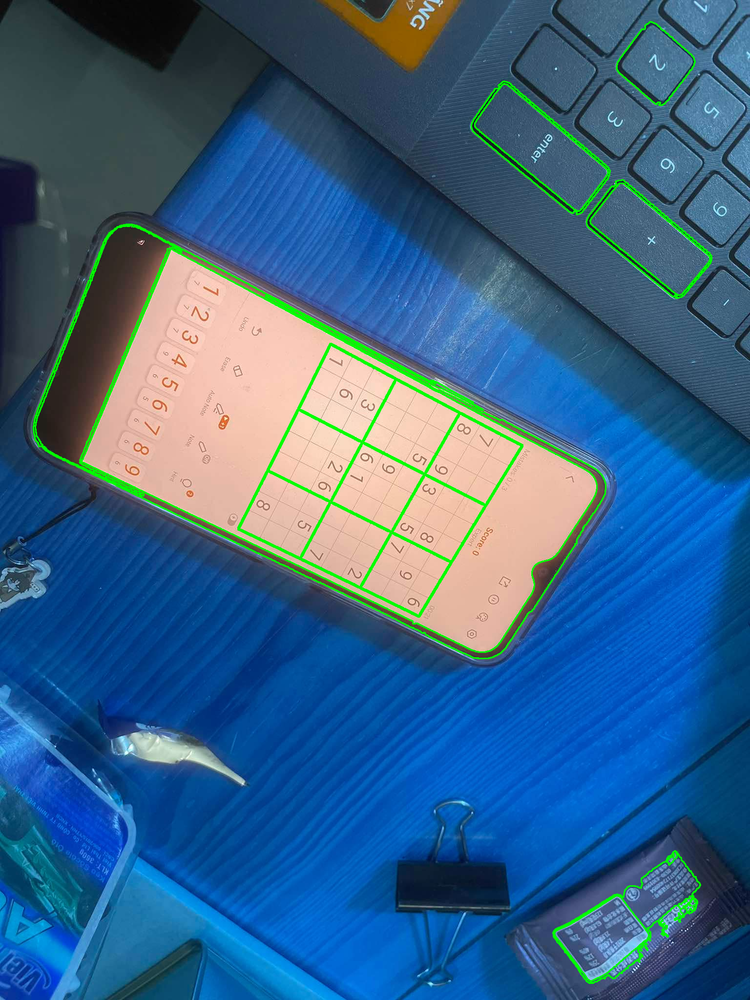

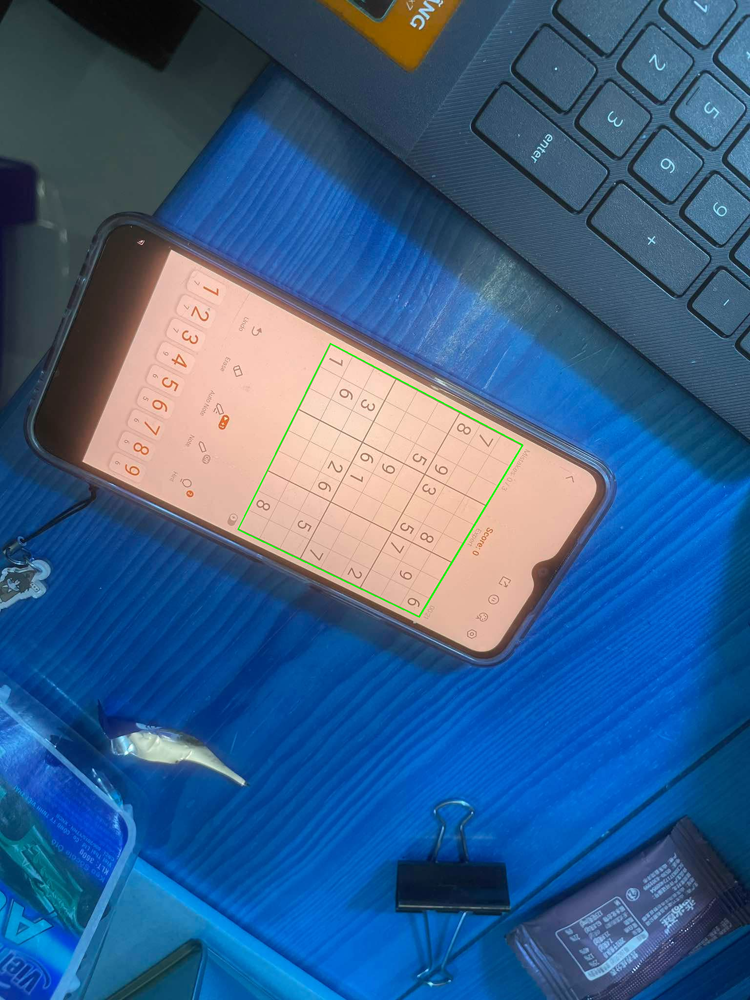

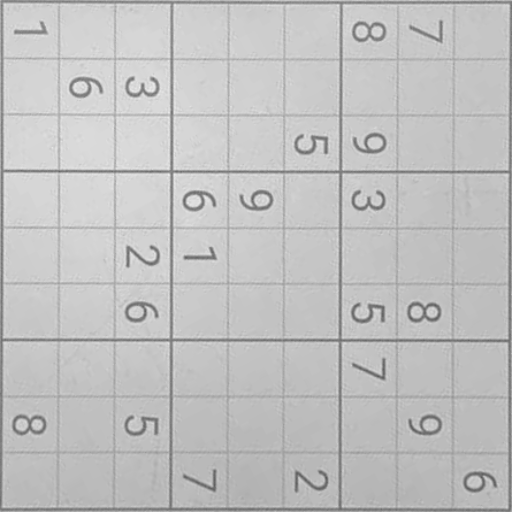

[2025/02/08 04:03:24] ppocr DEBUG: dt_boxes num : 22, elapsed : 1.4798929691314697
[2025/02/08 04:03:25] ppocr DEBUG: rec_res num  : 22, elapsed : 0.8626210689544678


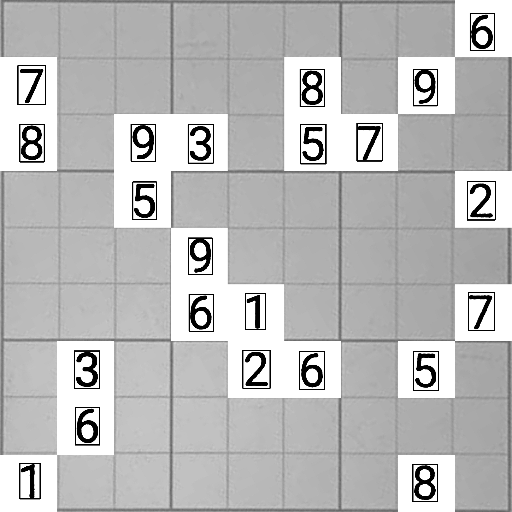

Bài toán Sudoku:
Puzzle has exactly one solution
+-------+-------+-------+
|       |       |     6 |
| 7     |     8 |   9   |
| 8   9 | 3   5 | 7     |
+-------+-------+-------+
|     5 |       |     2 |
|       | 9     |       |
|       | 6 1   |     7 |
+-------+-------+-------+
|   3   |   2 6 |   5   |
|   6   |       |       |
| 1     |       |   8   |
+-------+-------+-------+

Giải pháp:
Puzzle has exactly one solution
+-------+-------+-------+
| 2 5 3 | 7 9 1 | 8 4 6 |
| 7 1 6 | 2 4 8 | 3 9 5 |
| 8 4 9 | 3 6 5 | 7 2 1 |
+-------+-------+-------+
| 6 7 5 | 4 8 3 | 9 1 2 |
| 3 2 1 | 9 5 7 | 4 6 8 |
| 9 8 4 | 6 1 2 | 5 3 7 |
+-------+-------+-------+
| 4 3 7 | 8 2 6 | 1 5 9 |
| 5 6 8 | 1 3 9 | 2 7 4 |
| 1 9 2 | 5 7 4 | 6 8 3 |
+-------+-------+-------+



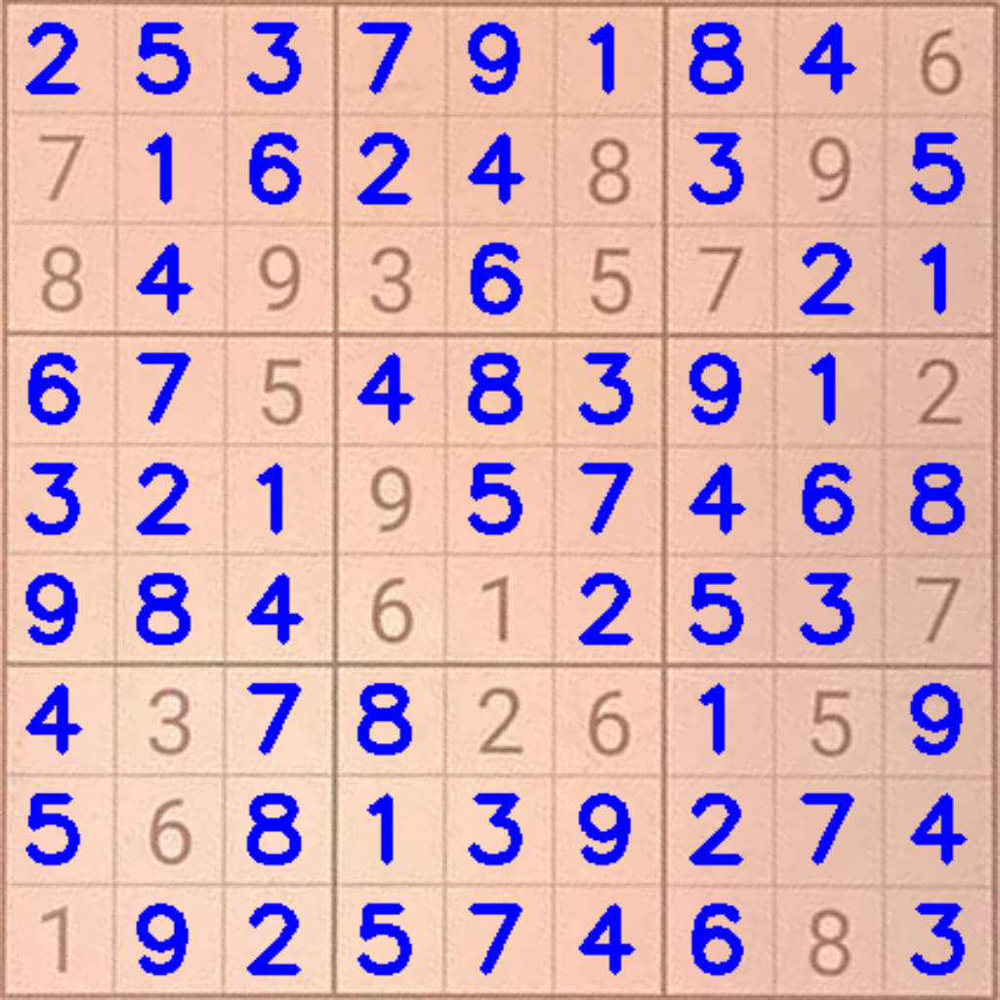

12


In [121]:
from datetime import datetime as dt

start = dt.now()

# Linh tinh
image1 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image1070.jpg")              #
image2 = cv2.imread("../Sudoku_OCR/sudoku_dataset/original/image1088.original.jpg")   #
image3 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image1011.jpg")              #
image4 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image1059.jpg")              #
image5 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image211.jpg")
image6 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image24.jpg")                       
image7 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image1020.jpg")              #             
image8 = cv2.imread("../Sudoku_OCR/sudoku_dataset/original/image1046.original.jpg")          

# Các trường hợp ảnh mờ khó tìm được contour viền sudoku    
image9 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image209.jpg")                     
image10 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image114.jpg")
image11 = cv2.imread("../Sudoku_OCR/sudoku_dataset/original/image1045.original.jpg")
image12 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image104.jpg")
image13 = cv2.imread("../Sudoku_OCR/sudoku_dataset/images/image13.jpg")

# Các trường hợp ảnh vuông 90 độ                
image14 = cv2.imread("../Sudoku_OCR/sudoku_24.jpg")

# Pipeline
image = cv2.rotate(image14, cv2.ROTATE_180)

sudoku_result = sudoku_pipeline(image, debug_find_puzzle=True, debug_process_grid=False, debug_ocr=True, debug_fill=True,
                         preprocess=True, process_grid=True, ocr=True, solve=True, fill=True)

print((dt.now() - start).seconds)

## Some other examples

In [ ]:
from datasets import load_dataset

sudoku_collection = load_dataset("Lexski/sudoku-image-recognition")

In [45]:
sudoku_collection

DatasetDict({
    train: Dataset({
        features: ['image', 'cells', 'keypoints'],
        num_rows: 1000
    })
    validation: Dataset({
        features: ['image', 'cells', 'keypoints'],
        num_rows: 200
    })
    test: Dataset({
        features: ['image', 'cells', 'keypoints'],
        num_rows: 200
    })
})

[2025/02/07 16:38:05] ppocr DEBUG: dt_boxes num : 181, elapsed : 6.106167554855347
[2025/02/07 16:38:15] ppocr DEBUG: rec_res num  : 181, elapsed : 9.910772800445557


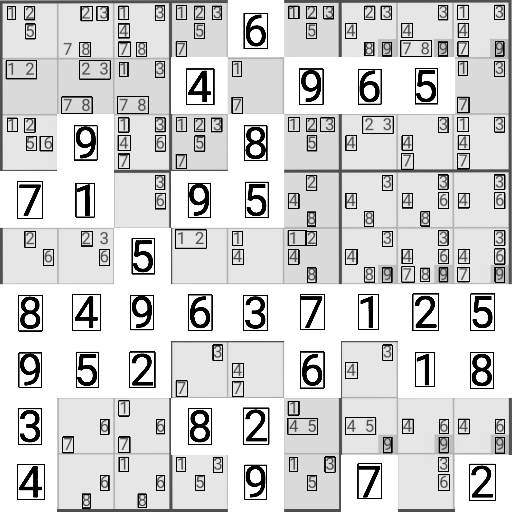

Bài toán Sudoku:
Puzzle has exactly one solution
+-------+-------+-------+
|       |   6   |       |
|       | 4   9 | 6 5   |
|   9   |   8   |       |
+-------+-------+-------+
| 7 1   | 9 5   |       |
|     5 |       |       |
| 8 4 9 | 6 3 7 | 1 2 5 |
+-------+-------+-------+
| 9 5 2 |     6 |   1 8 |
| 3     | 8 2   |       |
| 4     |   9   | 7   2 |
+-------+-------+-------+

50


In [48]:
start = dt.now()
sudoku_result = sudoku_pipeline(np.array(sudoku_collection['train']['image'][0]), debug_find_puzzle=False, debug_process_grid=False, debug_ocr=True,
                         preprocess=True, process_grid=True, ocr=True, solve=False)
print((dt.now() - start).seconds)

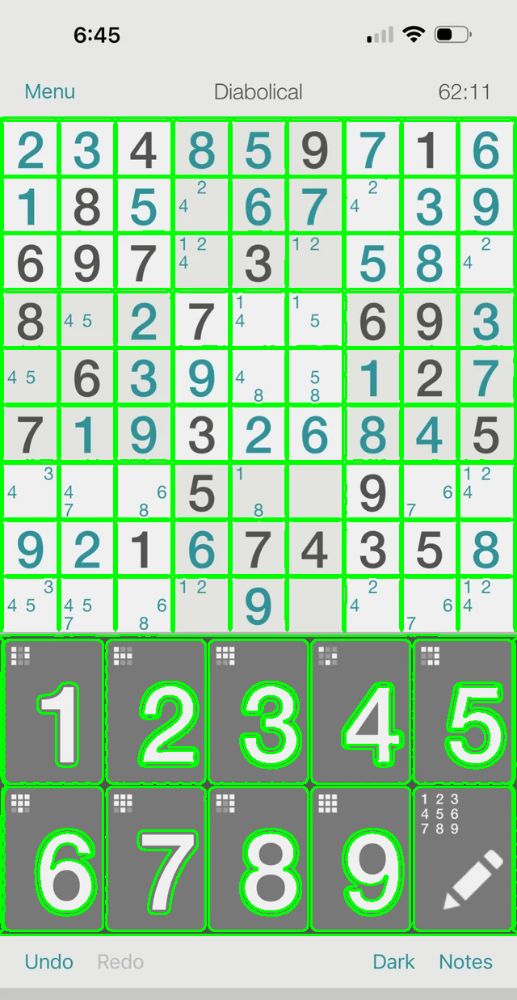

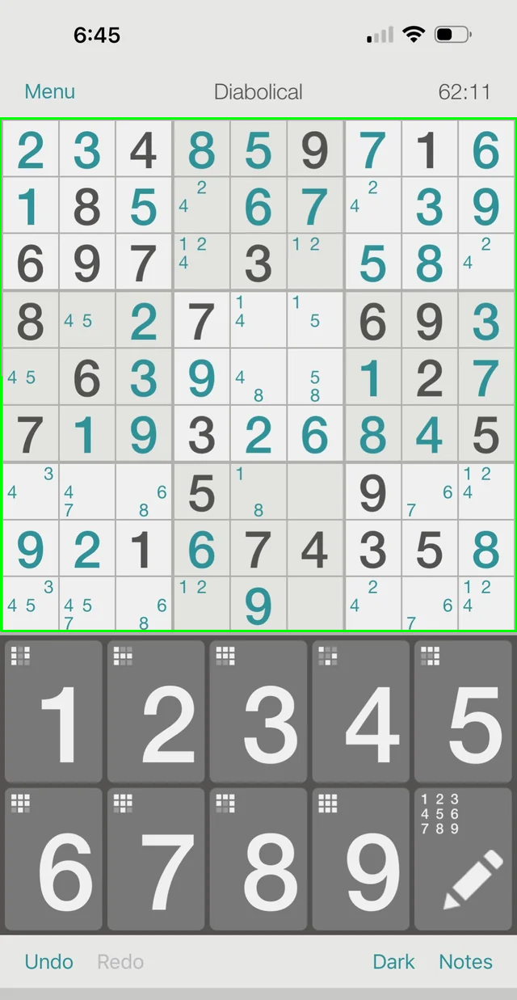

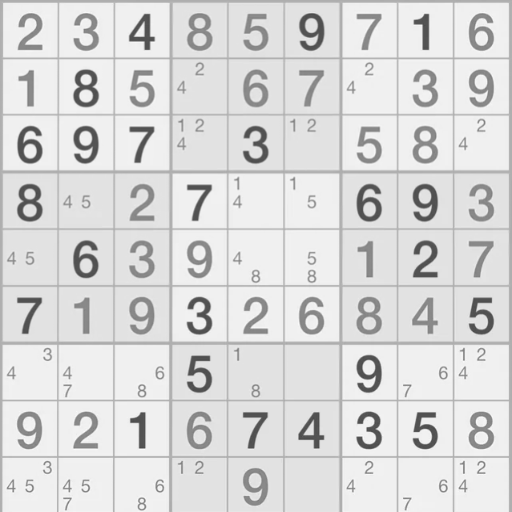

[2025/02/07 16:47:58] ppocr DEBUG: dt_boxes num : 101, elapsed : 6.226437568664551
[2025/02/07 16:48:04] ppocr DEBUG: rec_res num  : 101, elapsed : 6.152841806411743


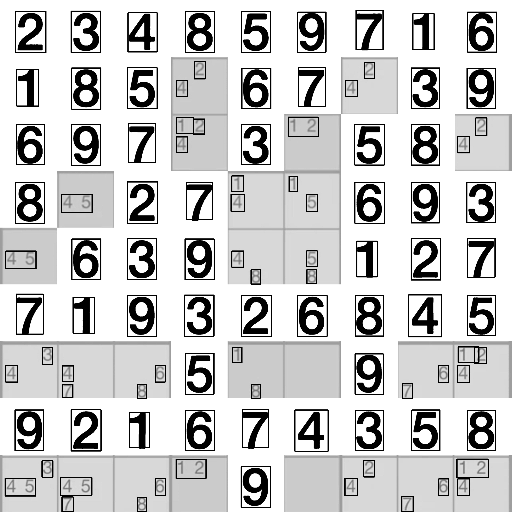

Bài toán Sudoku:
Puzzle has exactly one solution
+-------+-------+-------+
| 2 3 4 | 8 5 9 | 7 1 6 |
| 1 8 5 |   6 7 |   3 9 |
| 6 9 7 |   3   | 5 8   |
+-------+-------+-------+
| 8   2 | 7     | 6 9 3 |
|   6 3 | 9     | 1 2 7 |
| 7 1 9 | 3 2 6 | 8 4 5 |
+-------+-------+-------+
|       | 5     | 9     |
| 9 2 1 | 6 7 4 | 3 5 8 |
|       |   9   |       |
+-------+-------+-------+

41


In [58]:
start = dt.now()
sudoku_result = sudoku_pipeline(np.array(sudoku_collection['train']['image'][25]), debug_find_puzzle=True, debug_process_grid=False, debug_ocr=True,
                         preprocess=True, process_grid=True, ocr=True, solve=False)
print((dt.now() - start).seconds)

[2025/02/07 16:48:38] ppocr DEBUG: dt_boxes num : 156, elapsed : 5.6969335079193115
[2025/02/07 16:48:46] ppocr DEBUG: rec_res num  : 156, elapsed : 7.442309379577637


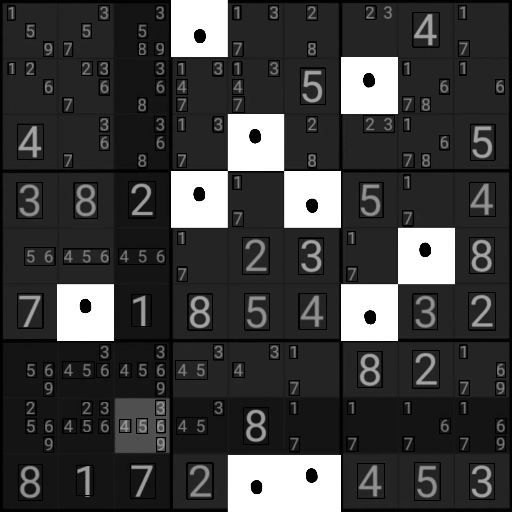

Bài toán Sudoku:
Puzzle has exactly one solution
+-------+-------+-------+
|       |       |   4   |
|       |     5 |       |
| 4     |       |     5 |
+-------+-------+-------+
| 3 8 2 |       | 5   4 |
|       |   2 3 |     8 |
| 7   1 | 8 5 4 |   3 2 |
+-------+-------+-------+
|       |       | 8 2   |
|       |   8   |       |
| 8 1 7 | 2     | 4 5 3 |
+-------+-------+-------+

44


In [59]:
start = dt.now()
sudoku_result = sudoku_pipeline(np.array(sudoku_collection['train']['image'][15]), debug_find_puzzle=False, debug_process_grid=False, debug_ocr=True,
                         preprocess=True, process_grid=True, ocr=True, solve=False)
print((dt.now() - start).seconds)

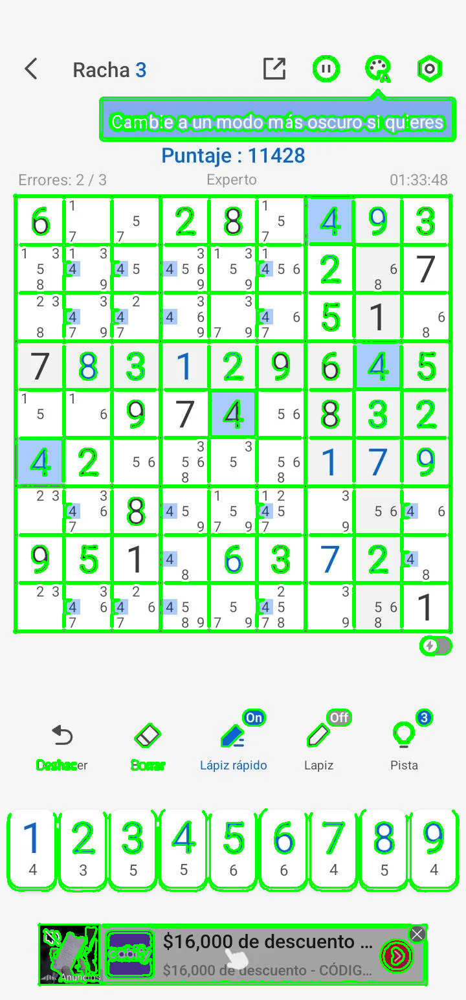

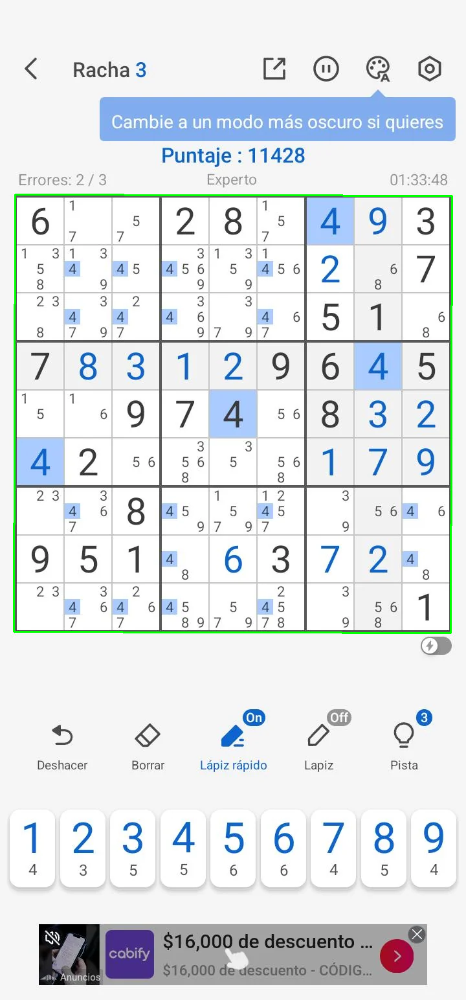

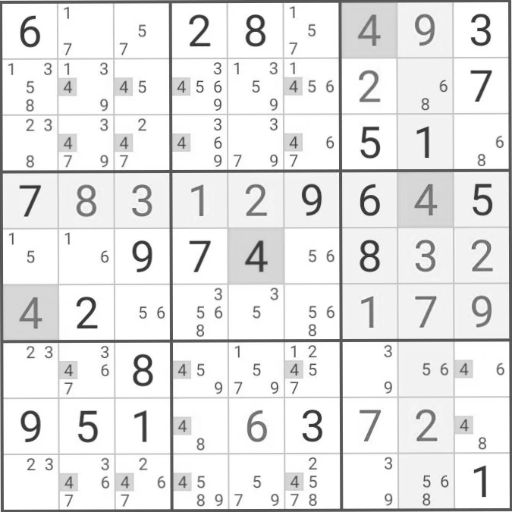

[2025/02/07 16:50:57] ppocr DEBUG: dt_boxes num : 155, elapsed : 5.3517091274261475
[2025/02/07 16:51:05] ppocr DEBUG: rec_res num  : 155, elapsed : 8.190587282180786


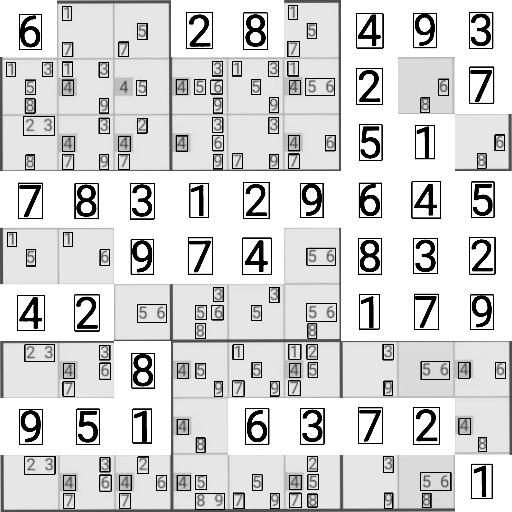

Bài toán Sudoku:
Puzzle has exactly one solution
+-------+-------+-------+
| 6     | 2 8   | 4 9 3 |
|       |       | 2   7 |
|       |       | 5 1   |
+-------+-------+-------+
| 7 8 3 | 1 2 9 | 6 4 5 |
|     9 | 7 4   | 8 3 2 |
| 4 2   |       | 1 7 9 |
+-------+-------+-------+
|     8 |       |       |
| 9 5 1 |   6 3 | 7 2   |
|       |       |     1 |
+-------+-------+-------+

43


In [61]:
start = dt.now()
sudoku_result = sudoku_pipeline(np.array(sudoku_collection['train']['image'][20]), debug_find_puzzle=True, debug_process_grid=False, debug_ocr=True,
                         preprocess=True, process_grid=True, ocr=True, solve=False)
print((dt.now() - start).seconds)

## Gradio app

In [ ]:
import gradio as gr

# Example function
def greet(name):
    return f"Hello, {name}!"

# Create Gradio Interface
demo = gr.Interface(fn=greet, inputs="text", outputs="text")
demo.launch(debug=True)  

Running on local URL:  http://127.0.0.1:7865

To create a public link, set `share=True` in `launch()`.
